<a href="https://colab.research.google.com/github/danakembara/leaf-count-detect/blob/main/task1_leaf_counting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Task I : Leaf Counting
Group members :    
- 1239686 - Dana Putra Kembara
- 1311085 - Efraim Partogi Nahotasi

Task: Develop a convolutional neural network (CNN) regression model that takes an image as input and predicts the number of leaves in the image as a regression output.

# Data Preparation

A lot of effort in solving any machine learning problem goes in to preparing the data. The most important tool is the Dataset class. This class allows your deep learning algorithm to iterate over your data and apply different transormations or filters to it.

For more info you can have a look at the [documentation](https://pytorch.org/docs/stable/data.html) of the Dataset class, or to its [source code](https://github.com/pytorch/pytorch/blob/master/torch/utils/data/dataset.py).

To load your custom dataset, you need to create your own `CustomDataset` class, which should inherit the `torch.utils.data.Dataset` class. You'll always need to overwrite 3 metods:
* `__init__` How your dataset should be initialized/created.
* `__len__` To calculate the lenght of your dataset. This methods allows you to do `len(dataset)` and get the size of the dataset.
* `__getitem__` To get one sample from your dataset based on its index. It supports the indexing such that `dataset[i]` can be used to get ith sample.




In [ ]:
!pip install d2l==0.16.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.2/77.2 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.5 MB/s eta 0:00:00


## Importing the Dataset
In this tutorial, you'll build a custom dataset cass which can be used to train a deep learning algorithm to count the number of leafs given an image of a plant.

First, let's download the dataset.

In [ ]:
# Get dataset from git.wur.nl
!git clone https://git.wur.nl/deep-learning-course/leaf-dataset

Cloning into 'leaf-dataset'...
remote: Enumerating objects: 437, done.
remote: Total 437 (delta 0), reused 0 (delta 0), pack-reused 437
Receiving objects: 100% (437/437), 31.85 MiB | 11.28 MiB/s, done.


In [ ]:
# Have a look at what the dataset contains
!ls leaf-dataset/detection

ara2012_plant001_bbox.csv  ara2012_plant073_bbox.csv  ara2013_plant066_bbox.csv
ara2012_plant001_rgb.png   ara2012_plant073_rgb.png   ara2013_plant066_rgb.png
ara2012_plant002_bbox.csv  ara2012_plant074_bbox.csv  ara2013_plant068_bbox.csv
ara2012_plant002_rgb.png   ara2012_plant074_rgb.png   ara2013_plant068_rgb.png
ara2012_plant003_bbox.csv  ara2012_plant075_bbox.csv  ara2013_plant069_bbox.csv
ara2012_plant003_rgb.png   ara2012_plant075_rgb.png   ara2013_plant069_rgb.png
ara2012_plant004_bbox.csv  ara2012_plant076_bbox.csv  ara2013_plant072_bbox.csv
ara2012_plant004_rgb.png   ara2012_plant076_rgb.png   ara2013_plant072_rgb.png
ara2012_plant005_bbox.csv  ara2012_plant077_bbox.csv  ara2013_plant074_bbox.csv
ara2012_plant005_rgb.png   ara2012_plant077_rgb.png   ara2013_plant074_rgb.png
ara2012_plant006_bbox.csv  ara2012_plant078_bbox.csv  ara2013_plant075_bbox.csv
ara2012_plant006_rgb.png   ara2012_plant078_rgb.png   ara2013_plant075_rgb.png
ara2012_plant007_bbox.csv  ara2012_plant079_bb

This dataset contains labels for two different tasks: counting and detecting leafs.

Concretely, it contains:
* A RGB image per plant (e.g. *ara2012_plant117_rgb.png*)
* A csv file per plant containing the bounding box of the leafs (e.g. *ara2012_plant117_bbox.csv*)
* A csv file which store the total number of leafs per every plant in the dataset: *Leaf_counts.csv*

Since we want to create a dataset class that allows us to train a deep learning to count the number of leafs, we will need 2 things from the dataset:
  1. The RGB image of every plant (both ara2012 and ara2013 sub-sets)
  2. A csv files with the leaf counts per image.

In [ ]:
import os
from d2l import torch as d2l
import glob
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import torch
import torchvision
from PIL.Image import Image

from torch import nn
import torchvision.transforms as transforms
from torchvision.transforms.functional import to_tensor, to_pil_image

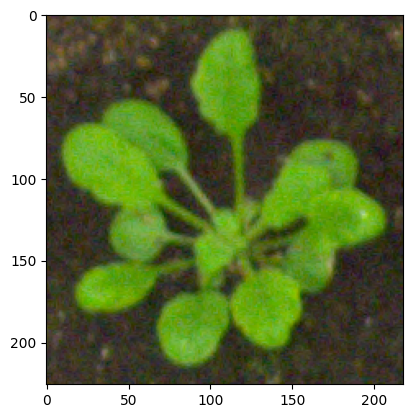

In [ ]:
root = 'leaf-dataset/detection/' # Path to dataset

# Take a look at one image
image = d2l.Image.open(os.path.join(root, 'ara2012_plant001_rgb.png'))
d2l.plt.imshow(image);

In [ ]:
# Check what the csv files contain
with open(os.path.join(root, 'Leaf_counts.csv'), 'r') as f:
    for line in f:
        filename, n_leafs = (line.rstrip().split(', '))
        print(filename, n_leafs)

ara2013_plant002  8
ara2013_plant004  7
ara2013_plant008  8
ara2013_plant014  8
ara2013_plant019  8
ara2013_plant021  6
ara2013_plant024  8
ara2013_plant028  9
ara2013_plant031  6
ara2013_plant032  9
ara2013_plant035  9
ara2013_plant039  7
ara2013_plant042  8
ara2013_plant043  8
ara2013_plant045  7
ara2013_plant046 10
ara2013_plant049  9
ara2013_plant051 10
ara2013_plant052  9
ara2013_plant054 10
ara2013_plant057 10
ara2013_plant059  9
ara2013_plant061  8
ara2013_plant064  9
ara2013_plant066  9
ara2013_plant068  9
ara2013_plant069 10
ara2013_plant072 10
ara2013_plant074  9
ara2013_plant075 10
ara2013_plant077  9
ara2013_plant079 11
ara2013_plant081  9
ara2013_plant083 10
ara2013_plant085 10
ara2013_plant087 10
ara2013_plant088 11
ara2013_plant091 10
ara2013_plant093  9
ara2013_plant096 11
ara2013_plant097 12
ara2013_plant099 11
ara2013_plant100  8
ara2013_plant101 10
ara2013_plant103  8
ara2013_plant104 12
ara2013_plant106 12
ara2013_plant107 11
ara2013_plant108  8
ara2013_plant109 10


## Custom Dataset for Leaf Counting
Let's start to create our custom dataset.

To do so, first we need to create the class and the `__init__` method.
```python
class LeafDataset(torch.utils.data.Dataset):
    def __init__(self, ...):
        ...
```

**Exercise 1:** complete the `__init__` method so the `self.images` and `self.labels` attributes contain a list with all the images paths and counts of leafs. Do it in a way that `self.labels[i]` contains the number of leafs of the ith image `self.image[i]`. For instance:
* `self.images[3] = 'leaf_segmentation_dataset/detection/ara2012_plant004_rgb.png'`
* `self.labels[3] = 13`

**Exercise 2:** now that the `__init__` method is complete, let's go for the `__get_item__` method. Try to complete the code in this method. To read an image given a path you might want to use the `d2l.Image.open` function. Additionally, the returned `labels` should be `torch.tensor`.


In [ ]:
class LeafDataset(torch.utils.data.Dataset):
    def __init__(self, directory, is_train=True, transforms=None):
        self.images = []
        self.labels = []
        self.transforms = transforms

        with open(os.path.join(root, 'Leaf_counts.csv'), 'r') as f:
            for line in f:
                filename, n_leafs = (line.rstrip().split(', '))
                filename = filename + '_rgb.png'
                img_path = os.path.join(directory, filename)
                # TODO: add your code here (~2 lines). Fill the corresponding lists with the images and labels
                self.images.append(img_path)
                self.labels.append(float(n_leafs))

        X_train, X_test, y_train, y_test = train_test_split(
            self.images, self.labels, test_size=0.25, random_state=42)
        if is_train:
            self.images = X_train
            self.labels = y_train
        else:
            self.images = X_test
            self.labels = y_test
    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        # TODO: complete the code
        img = d2l.Image.open(self.images[idx])    # Load the image
        labels = torch.tensor(self.labels[idx])   # Put the label (n_leafs) in a tensor
        new_size = (128, 128)                     # Size 128x128
        img = img.resize(new_size)

        # Assertions to check that everything is correct
        assert(isinstance(img, Image)), "Image variable should be a PIL Image"
        assert(isinstance(labels, torch.Tensor)), "Labels varibable should be a torch tensor"
        assert(labels.dtype == torch.float32), "Labels variable datatype should be float32"

        if self.transforms is not None:
            img = self.transforms(img)

        return img, labels

Let's check if our code works as it should. If you run the following block, you should see an image a a plant an a text saying how many leaves it has.

This plant contains 15 leafs


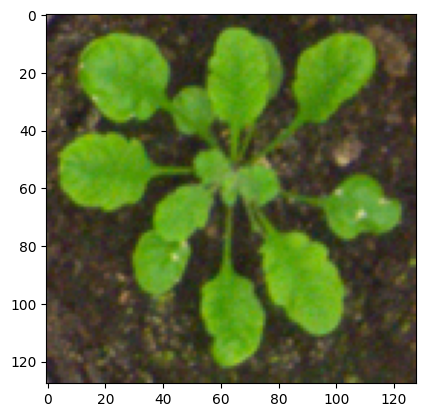

In [ ]:
# Let's check if the dataset class works properly
dataset = LeafDataset(root, is_train=True)
image, label = dataset[8]
d2l.plt.imshow(image)
print('This plant contains', int(label.detach().numpy()), 'leafs')

Congratulations, you have built your first custom dataset class!

## Performance Metrics
When you learned LeNet, you used this function to evaluate the performance of a network in a dataset:
```python
def evaluate_accuracy_gpu(net, data_iter, device=None): #@save
    """Compute the accuracy for a model on a dataset using a GPU."""
    if isinstance(net, nn.Module):
        net.eval()  # Set the model to evaluation mode
        if not device:
            device = next(iter(net.parameters())).device
    # No. of correct predictions, no. of predictions
    metric = d2l.Accumulator(2)

    with torch.no_grad():
        for features, labels in data_iter:        
            if isinstance(features, list):
               features = [feature.to(device) for feature in features]
            else:
               features = features.to(device)
            labels = labels.to(device)
            metric.add(d2l.accuracy(net(features), labels), labels.numel())
    return metric[0] / metric[1]
```

However, this fuction was built for classification, not for regression. We need to develop a corresponding one for regression which we can then use in our training loops.

During the MLP lecture, you learned about Pearson correlation coefficient (also known as *r*). You can learn more about it [here](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient). In summary, it evaluates the correlation between 2 set of values. The closer the value is to 1 or -1, the more correlated the values are. In our case, with predictions and ground truths, *r* tells you how close your network predictions are to the ground truth.
```python
def pearson_correlation(x1, x2, eps=1e-8):
    """Returns Pearson coefficient between 1D-tensors x1 and x2
    Args:
        x1 (Variable): First input (1D).
        x2 (Variable): Second input (of size matching x1).
        eps (float, optional): Small value to avoid division by zero.
            Default: 1e-8
    Example:
        >>> input1 = autograd.Variable(torch.randn(128))
        >>> input2 = autograd.Variable(torch.randn(128))
        >>> output = F.pearson_correlation(input1, input2)
        >>> print(output)
    """
    assert x1.dim() == 1, "Input must be 1D matrix / vector."
    assert x1.size() == x2.size(), "Input sizes must be equal."
    x1_bar = x1 - x1.mean()
    x2_bar = x2 - x2.mean()
    dot_prod = x1_bar.dot(x2_bar)
    norm_prod = x1_bar.norm(2) * x2_bar.norm(2)
    return dot_prod / norm_prod.clamp(min=eps)
```

The loss itself can be used as a metric for our predictions. Therefore, we would like to calculate it together with the Pearson coefficient (*r*).

Complete the code in the next block to develop this function.



In [ ]:
# We saw this function in the MLP notebooks
def pearson_correlation(x1, x2, eps=1e-8):
    """Returns Pearson coefficient between 1D-tensors x1 and x2
    Args:
        x1 (torch.Tensor): First input (1D).
        x2 (torch.Tensor): Second input (of size matching x1).
        eps (float, optional): Small value to avoid division by zero.
            Default: 1e-8
    Example:
        >>> input1 = autograd.Variable(torch.randn(128))
        >>> input2 = autograd.Variable(torch.randn(128))
        >>> output = F.pearson_correlation(input1, input2)
        >>> print(output)
    """
    assert x1.dim() == 1, "Input must be 1D matrix / vector."
    assert x1.size() == x2.size(), "Input sizes must be equal."
    x1_bar = x1 - x1.mean()
    x2_bar = x2 - x2.mean()
    dot_prod = x1_bar.dot(x2_bar)
    norm_prod = x1_bar.norm(2) * x2_bar.norm(2)
    return dot_prod / norm_prod.clamp(min=eps)


def evaluate_loss_pearson_gpus(net, data_iter, loss, device):
    '''
    Function to evaluate the loss and Pearson coefficient of a CNN on a data iterator
    Args:
        net: network
        data_iter (torch.data.Dataloader): dataloader to iterate to
        loss: loss used to train the model
        device: device where the model is loaded. For example, gpu0. You can get it from d2l.try_all_gpus()

    Returns:
        average loss of the model in the data
        average pearson coefficient in the data

    '''
    if isinstance(net, torch.nn.Module):
        net.eval()  # Set the model to evaluation mode
    metric = d2l.Accumulator(4)  # loss, num_examples, pearson, 1 (for loop iter counter)
    for features, labels in data_iter:
        if isinstance(features, list):
            features = [feature.to(device) for feature in features]
        else:
            features = features.to(device)
        labels = labels.to(device)
        pred = net(features)
        # TODO: add your code here (~2 lines).
        # Expected output: variable called loss_sum which contains the sum of the losses per sample
        # ...
        # loss_sum = ...
        loss_sum = loss(pred, labels).sum().item() # Compute the sum of losses per sample

        # Check that loss_sum is a float
        assert(isinstance(loss_sum, float)), "loss variable variable should be a float type"

        # TODO: add your code here (~2 lines).
        # Expected output: variable called pr which contains pearson coefficient of the samples and GT
        # ...
        # pr = ...
        pr = pearson_correlation(pred.flatten(), labels.flatten()).item() # Compute the Pearson correlation between predictions and labels

        # Check that pr is a float
        assert(isinstance(pr, float)), "Pearson coefficient variable should be a float type"
        metric.add(loss_sum, pr, labels.shape[0], 1)
    return metric[0] / metric[2], metric[1] / metric[3]

Now you can start with the first part of the project!

# Training the Models

## Data Augmentation

First, let's inspect the size of the training and test dataset.

In [ ]:
# Separating the train and test dataset
train_dataset = LeafDataset(root, is_train=True)
test_dataset = LeafDataset(root, is_train=False)

# Checking the size of train and test dataset
print("The size of train dataset:", len(train_dataset), "images")
print("The size of test dataset:", len(test_dataset), "images")

The size of train dataset: 161 images
The size of test dataset: 54 images


As the training dataset is considered small compared to its corresponding test dataset, data augmentation might be needed to artificially generate new training images from the existing ones by applying various image transformation techniques.

Here, we define CustomTransform class to transform training images:
*   Randomly crop an area of 70% to 90% with the ratio of width to height randomly selected between 1 and 2 of the original area
*   Randomly change the brightnes and saturation of the image to a value between 80% to 90%, and a contrast of 150% of the original images
*   Randomly horizontally flip the images with 50% probability




In [ ]:
import random
class CustomTransform:
    """
    Applies custom transformations to an image.
    """
    def __init__(self, p=0.5, seed=None):
        """
        Initializes the transform.
        Args:
            p: float, probability of applying the transform (default: 0.5)
        """
        self.p = p
        self.seed = seed

    def __call__(self, img):
        """
        Applies the transform to an image and its corresponding label.
        Args:
            image: PIL.Image object, containing the original image.
        Returns:
            image_transformed: Tensor, containing the transformed image.
        """

        if self.seed is not None:
            random.seed(self.seed)

        # transform image to tensor, if no augmentation is applied

        img_transformed = transforms.ToTensor()(img)

        if random.random() < self.p:

            # In 50% of the cases (random) apply a horizontal flip
            do_flip = 1 if np.random.rand() > 0.5 else 0

            # Apply the transformations:
            image_transform = transforms.Compose([
              torchvision.transforms.RandomResizedCrop((128, 128), scale=(0.7, 0.9), ratio=(1, 2)),
              torchvision.transforms.ColorJitter(brightness=(0.8, 0.9), contrast=1.5,
                                                 saturation=(0.8, 0.9)),
              transforms.RandomHorizontalFlip(p=do_flip),
              transforms.ToTensor()
            ])

            img_transformed = image_transform(img)

        return img_transformed

In [ ]:
# visualize_single_sample is used to visualize the sample
def visualize_single_sample(image, title=""):
    """
    Visualize a single image.

    Parameters:
        image (PIL image): The input image.
    """
    fig, ax = d2l.plt.subplots()
    ax.imshow(image)
    if(title):
      d2l.plt.title(title)
    d2l.plt.show()

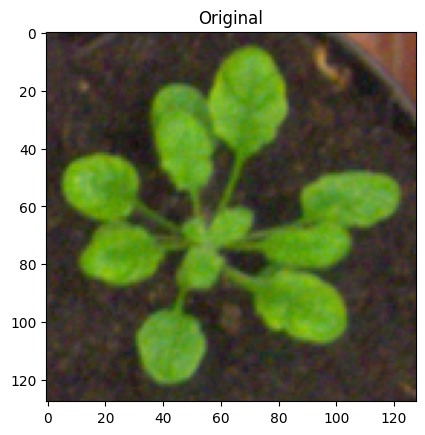

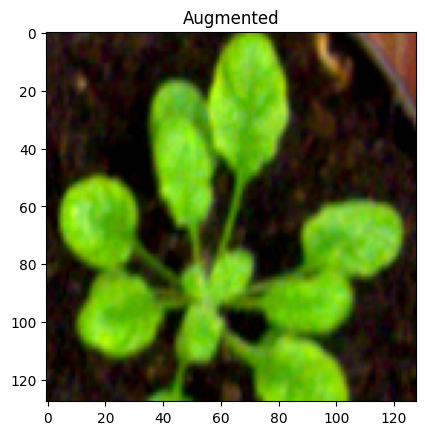

In [ ]:
img_id = np.random.randint(len(train_dataset))

# Load and show the original image
image, labels = train_dataset[img_id]
visualize_single_sample(image, "Original")

# Apply the image augmentation. Set probability of augmentation to 1, to make sure we see it
custom_transform = CustomTransform(p=1)
transformed_dataset = LeafDataset(root, is_train=True, transforms=custom_transform)

# Visualize the results
image_transformed, labels = transformed_dataset[img_id]
visualize_single_sample(to_pil_image(image_transformed), "Augmented")

The models will use the original and augmented datasets separately to tune the hyperparameter in data augmentation. The aim is to find the best match of hyperparameter in data augmentation that can achieve the highest Pearson Correlation number.

Next, the following codes will be used to manipulate the images so they can be fitted into the models.

In [ ]:
# Define NoTransform to change the PIL images into a Torch tensor
class NoTransform:
    def __call__(self, img):
        img_transformed = transforms.ToTensor()(img)

        return img_transformed

no_aug = NoTransform()

In [ ]:
# Get the traning and test dataloaders
def load_train_data(augs, batch_size):
    dataset = LeafDataset(root, is_train=True, transforms=augs)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                    shuffle=True, num_workers=1)
    return dataloader

def load_test_data(augs, batch_size):
    dataset = LeafDataset(root, is_train=False, transforms=augs)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                    shuffle=False, num_workers=1)
    return dataloader

In [ ]:
# train_batch trains the network on one batch of images
def train_batch(net, X, y, loss, trainer, device):
    X = X.to(device)
    y = y.to(device)
    net.train()
    trainer.zero_grad()
    pred = net(X)
    l = loss(pred, y)
    l.sum().backward()
    trainer.step()
    train_loss_sum = l.sum()
    return train_loss_sum

In [ ]:
# train trains the network for num_epoch epochs
def train(net, train_iter, test_iter, loss, trainer, num_epochs,
               device=d2l.try_gpu()):
    timer, num_batches = d2l.Timer(), len(train_iter)
    animator = d2l.Animator(xlabel='epoch', xlim=[1, num_epochs], ylim=[0, 5],
                            legend=['train loss', 'test_loss'])
    net.to(device)
    for epoch in range(num_epochs):
        # Store training_loss, num_examples, num_features
        metric = d2l.Accumulator(3)
        for i, (features, labels) in enumerate(train_iter):
            timer.start()
            l = train_batch(
                net, features, labels, loss, trainer, device)
            metric.add(l, labels.shape[0], labels.numel())
            timer.stop()
            if (i + 1) % (num_batches // 1) == 0 or i == num_batches - 1:
                animator.add(epoch + (i + 1) / num_batches,
                             (metric[0] / metric[2],
                              None))
                # Evaluate test loss at the end of each epoch
                test_loss = evaluate_loss_pearson_gpus(net, test_iter, loss, device)[0] # Use evaluate_loss_pearson_gpus
                pearson = evaluate_loss_pearson_gpus(net, test_iter, loss, device)[1]
                animator.add(epoch + (i + 1) / num_batches,(None, test_loss))
    print(f'train_loss {metric[0] / metric[2]:.3f}')
    print(f'test_loss {test_loss:.3f}')
    print(f'pearson {pearson:.3f}')
    print(f'{metric[2] * num_epochs / timer.sum():.1f} examples/sec on '
          f'{str(device)}')

In [ ]:
# train_net trains the network
def train_net(net, train_augs, test_augs, lr=0.01, num_epochs=35):
    train_loader = load_train_data(train_augs, batch_size)
    test_loader = load_test_data(test_augs, batch_size)

    # Define the loss as it is different from classification:
    loss = nn.MSELoss()

    trainer = torch.optim.Adam(net.parameters(), lr=lr)
    train(net, train_loader, test_loader, loss, trainer, num_epochs, device)

Also, the following codes will be used to evaluate the performance of the models by comparing their predicted output with the ground truth.

In [ ]:
# Evaluate the network
def predict(net, X):
    net.eval()
    output = net(X.to(device))
    return output

In [ ]:
# plot_samples is used to evaluate the output
def plot_samples(images, labels):
    for i in range(len(images)):
        image, label, GT = images[i], labels[i][0], labels[i][1]
        plt.imshow(image)
        d2l.plt.show()
        print('Predicted:', int(label[0].detach().numpy()), 'leafs')
        print('Ground Truth:', int(GT.detach().numpy()), 'leafs')

In this project, we will use three CNN architectures: AlexNet, Pre-trained ResNet18, and Pre-trained Resnet50, with each of them will be using the original and augmented dataset, respectively.

## Model 1: AlexNet

In [ ]:
# Defining the AlexNet model
alexnet = nn.Sequential(
            nn.LazyConv2d(96, kernel_size=11, stride=4, padding=4),
            nn.ReLU(),

            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),

            nn.LazyConv2d(256, kernel_size=5, padding=2),
            nn.ReLU(),

            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),

            nn.LazyConv2d(384, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.LazyConv2d(384, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.LazyConv2d(256, kernel_size=3, padding=1),
            nn.ReLU(),

            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),

            nn.Flatten(),

            nn.LazyLinear(4096),
            nn.ReLU(),
            nn.Dropout(p=0.5),

            nn.LazyLinear(4096),
            nn.ReLU(),
            nn.Dropout(p=0.5),

            # Changing the output class to 1
            nn.LazyLinear(1))

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [ ]:
# Initialize the network with random weights
batch_size, device = 256, d2l.try_gpu()

def init_weights(m):
    if type(m) in [nn.Linear, nn.Conv2d]:
        nn.init.xavier_uniform_(m.weight)

alexnet.apply(init_weights)

Sequential(
  (0): LazyConv2d(0, 96, kernel_size=(11, 11), stride=(4, 4), padding=(4, 4))
  (1): ReLU()
  (2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (3): LazyConv2d(0, 256, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU()
  (5): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (6): LazyConv2d(0, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU()
  (8): LazyConv2d(0, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU()
  (10): LazyConv2d(0, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU()
  (12): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (13): Flatten(start_dim=1, end_dim=-1)
  (14): LazyLinear(in_features=0, out_features=4096, bias=True)
  (15): ReLU()
  (16): Dropout(p=0.5, inplace=False)
  (17): LazyLinear(in_features=0, out_features=4096, bias=True)
  (18): ReLU()
  (19): Dropout(p=0.5, inplace=False)
  (20): 

In [ ]:
# Summary of the network
from torchsummary import summary

summary(alexnet, (3, 128, 128), device = 'cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 96, 32, 32]          34,944
              ReLU-2           [-1, 96, 32, 32]               0
         MaxPool2d-3           [-1, 96, 16, 16]               0
            Conv2d-4          [-1, 256, 16, 16]         614,656
              ReLU-5          [-1, 256, 16, 16]               0
         MaxPool2d-6            [-1, 256, 8, 8]               0
            Conv2d-7            [-1, 384, 8, 8]         885,120
              ReLU-8            [-1, 384, 8, 8]               0
            Conv2d-9            [-1, 384, 8, 8]       1,327,488
             ReLU-10            [-1, 384, 8, 8]               0
           Conv2d-11            [-1, 256, 8, 8]         884,992
             ReLU-12            [-1, 256, 8, 8]               0
        MaxPool2d-13            [-1, 256, 4, 4]               0
          Flatten-14                 [-

### AlexNet

train_loss 0.120
test_loss 0.336
pearson 0.736
1080.2 examples/sec on cuda:0


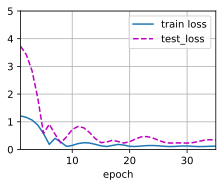

In [ ]:
# Make sure the network weights are reset to small random values
alexnet.apply(init_weights)

# Train the network
train_net(alexnet, train_augs=no_aug, test_augs=no_aug, lr=0.0001, num_epochs=35)

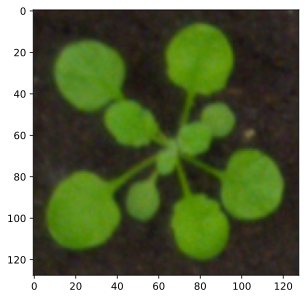

Predicted: 9 leafs
Ground Truth: 11 leafs


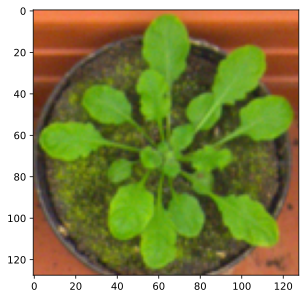

Predicted: 12 leafs
Ground Truth: 19 leafs


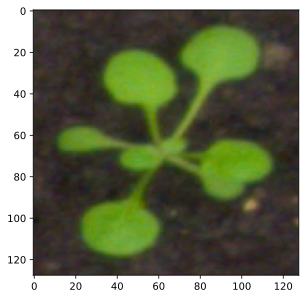

Predicted: 10 leafs
Ground Truth: 8 leafs


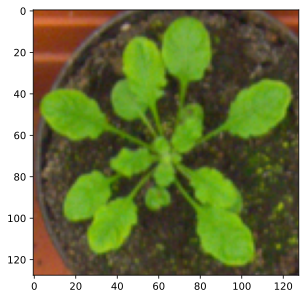

Predicted: 12 leafs
Ground Truth: 17 leafs


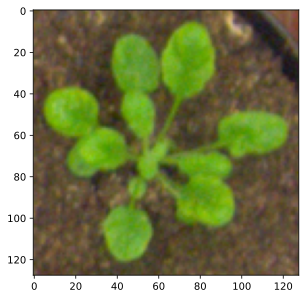

Predicted: 11 leafs
Ground Truth: 13 leafs


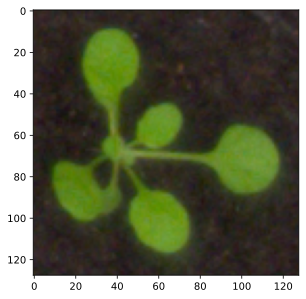

Predicted: 9 leafs
Ground Truth: 9 leafs


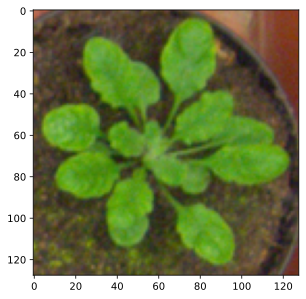

Predicted: 11 leafs
Ground Truth: 15 leafs


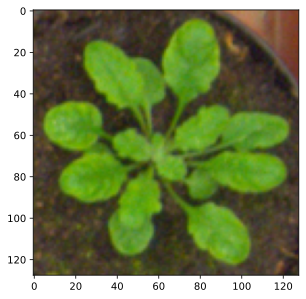

Predicted: 11 leafs
Ground Truth: 14 leafs


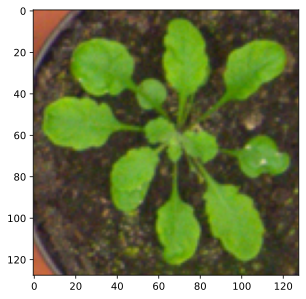

Predicted: 12 leafs
Ground Truth: 15 leafs


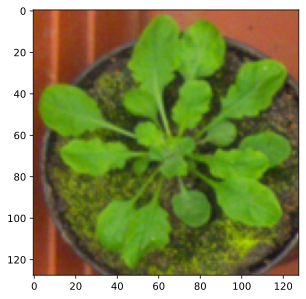

Predicted: 12 leafs
Ground Truth: 19 leafs


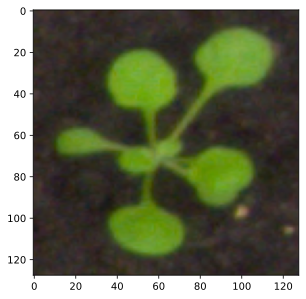

Predicted: 10 leafs
Ground Truth: 8 leafs


In [ ]:
# Load the test data for evaluation
eval_loader = load_train_data(no_aug, batch_size=1)

imgs= []
outputs = []

for index, (img, labels) in enumerate(eval_loader):
  pred_label = predict(alexnet, img)
  # detach the tensor from the computational graph:
  label = pred_label[0].detach().cpu()
  outputs.append((label,labels))
  imgs.append(to_pil_image(img[0]))
  if index == 10:
    break

plot_samples(imgs, outputs)

### AlexNet with Augmentation

train_loss 0.131
test_loss 0.247
pearson 0.757
1525.6 examples/sec on cuda:0


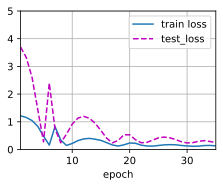

In [ ]:
# Make sure the network has freshly initialized weights
alexnet.apply(init_weights)

# Train with data aug
train_net(alexnet, train_augs=CustomTransform(p=1, seed=6), test_augs=no_aug, lr=0.0001, num_epochs=35)

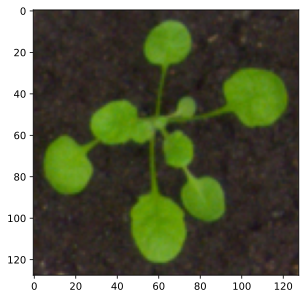

Predicted: 12 leafs
Ground Truth: 10 leafs


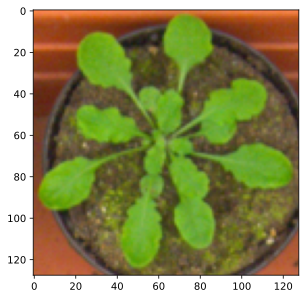

Predicted: 16 leafs
Ground Truth: 17 leafs


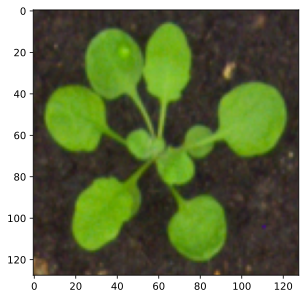

Predicted: 15 leafs
Ground Truth: 12 leafs


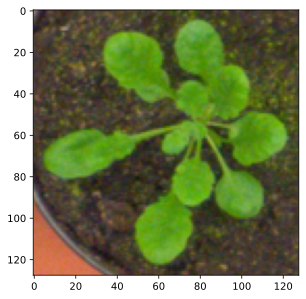

Predicted: 14 leafs
Ground Truth: 15 leafs


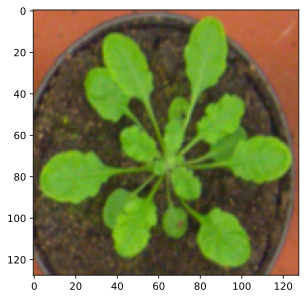

Predicted: 16 leafs
Ground Truth: 17 leafs


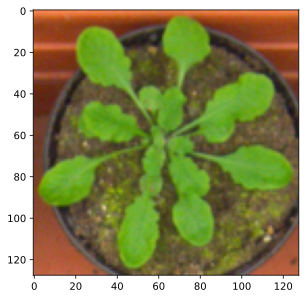

Predicted: 16 leafs
Ground Truth: 17 leafs


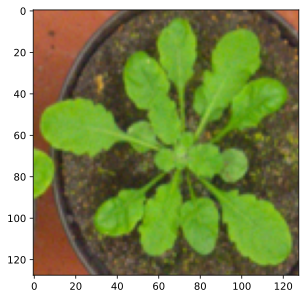

Predicted: 16 leafs
Ground Truth: 18 leafs


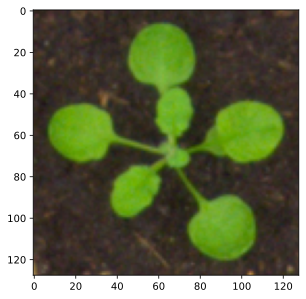

Predicted: 14 leafs
Ground Truth: 9 leafs


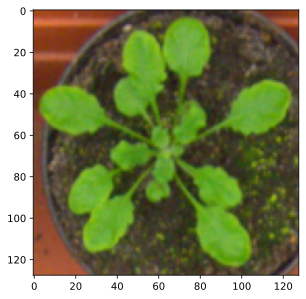

Predicted: 15 leafs
Ground Truth: 16 leafs


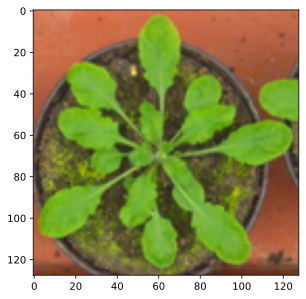

Predicted: 17 leafs
Ground Truth: 16 leafs


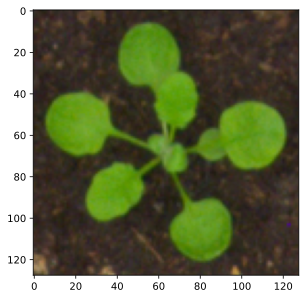

Predicted: 13 leafs
Ground Truth: 9 leafs


In [ ]:
# Load the test data for evaluation
eval_loader = load_train_data(no_aug, batch_size=1)

imgs= []
outputs = []

for index, (img, labels) in enumerate(eval_loader):
  pred_label = predict(alexnet, img)
  # detach the tensor from the computational graph:
  label = pred_label[0].detach().cpu()
  outputs.append((label,labels))
  imgs.append(to_pil_image(img[0]))
  if index == 10:
    break

plot_samples(imgs, outputs)

## Model 2: Pre-trained ResNet18

In [ ]:
# Importing Pre-trained ResNet18
pretrained_net = torchvision.models.resnet18(pretrained=True)
pretrained_net.fc = nn.Linear(in_features=512, out_features=1, bias=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 182MB/s]


In [ ]:
finetune_net = torchvision.models.resnet18(pretrained=True)
finetune_net.fc = nn.Linear(finetune_net.fc.in_features, 1)
nn.init.xavier_uniform_(finetune_net.fc.weight);

### ResNet18

train_loss 0.205
test_loss 1.158
pearson -0.217
697.9 examples/sec on cuda:0


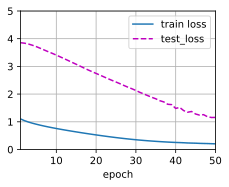

In [ ]:
train_net(finetune_net, train_augs=no_aug, test_augs=no_aug, lr=5e-5, num_epochs=50)

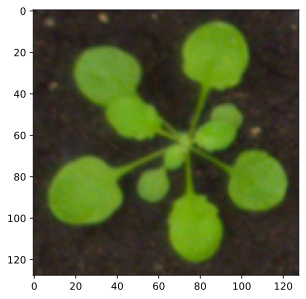

Predicted: 8 leafs
Ground Truth: 11 leafs


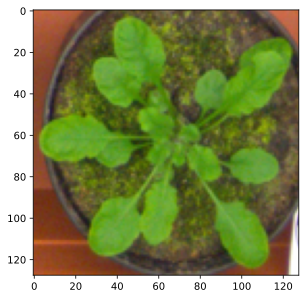

Predicted: 8 leafs
Ground Truth: 18 leafs


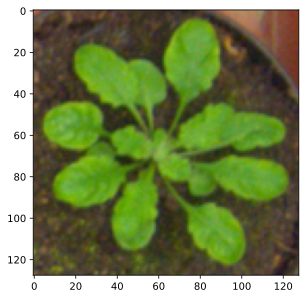

Predicted: 7 leafs
Ground Truth: 15 leafs


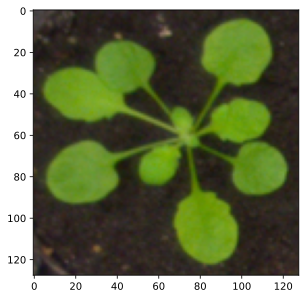

Predicted: 7 leafs
Ground Truth: 10 leafs


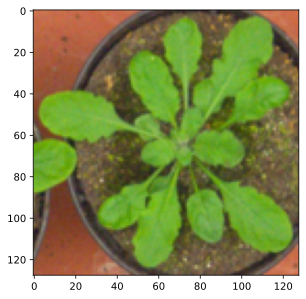

Predicted: 7 leafs
Ground Truth: 17 leafs


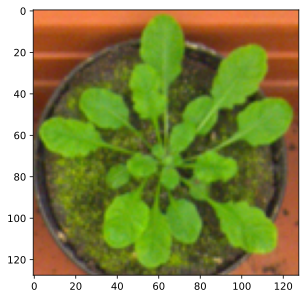

Predicted: 8 leafs
Ground Truth: 19 leafs


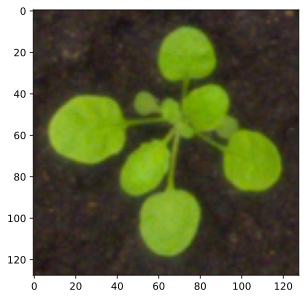

Predicted: 7 leafs
Ground Truth: 10 leafs


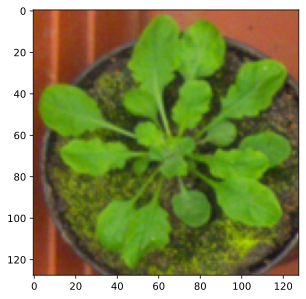

Predicted: 7 leafs
Ground Truth: 19 leafs


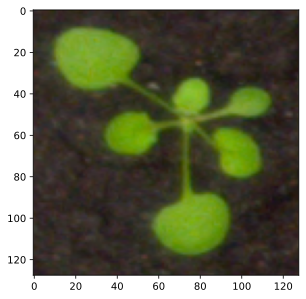

Predicted: 9 leafs
Ground Truth: 7 leafs


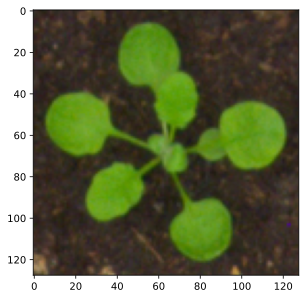

Predicted: 7 leafs
Ground Truth: 9 leafs


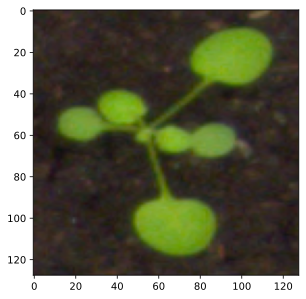

Predicted: 6 leafs
Ground Truth: 7 leafs


In [ ]:
# Load the test data for evaluation
eval_loader = load_train_data(no_aug, batch_size=1)

imgs= []
outputs = []

for index, (img, labels) in enumerate(eval_loader):
  pred_label = predict(finetune_net, img)
  # detach the tensor from the computational graph:
  label = pred_label[0].detach().cpu()
  outputs.append((label,labels))
  imgs.append(to_pil_image(img[0]))
  if index == 10:
    break

plot_samples(imgs, outputs)

### ResNet18 with Augmentation

train_loss 0.196
test_loss 0.744
pearson 0.306
708.4 examples/sec on cuda:0


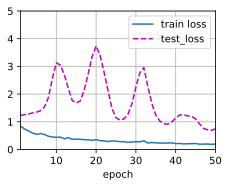

In [ ]:
train_net(finetune_net, train_augs=CustomTransform(p=1, seed=6), test_augs=no_aug, lr=5e-5, num_epochs=50)

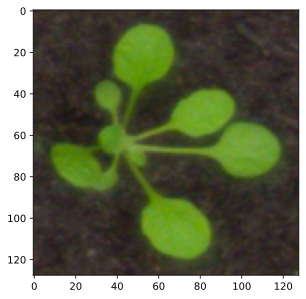

Predicted: 10 leafs
Ground Truth: 9 leafs


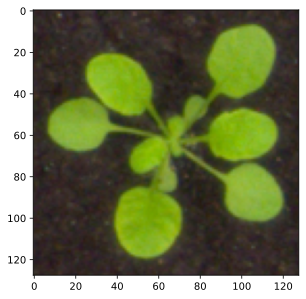

Predicted: 9 leafs
Ground Truth: 11 leafs


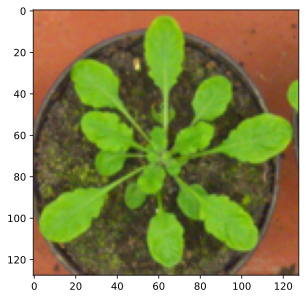

Predicted: 10 leafs
Ground Truth: 18 leafs


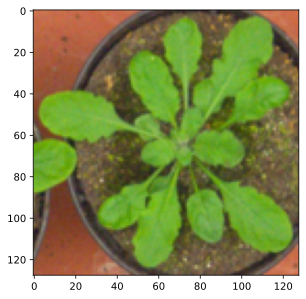

Predicted: 9 leafs
Ground Truth: 17 leafs


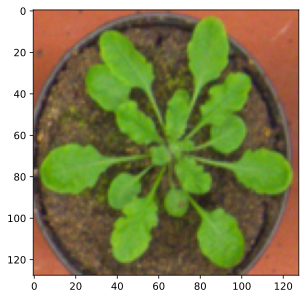

Predicted: 9 leafs
Ground Truth: 16 leafs


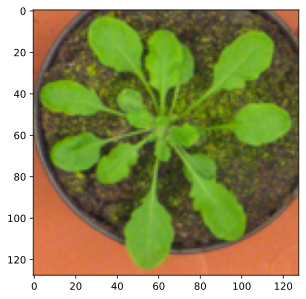

Predicted: 9 leafs
Ground Truth: 17 leafs


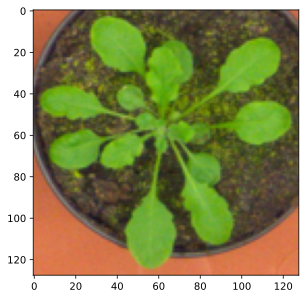

Predicted: 9 leafs
Ground Truth: 18 leafs


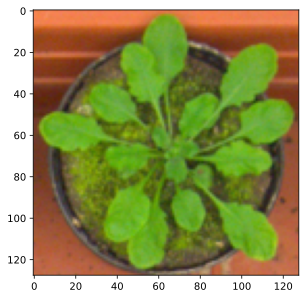

Predicted: 9 leafs
Ground Truth: 17 leafs


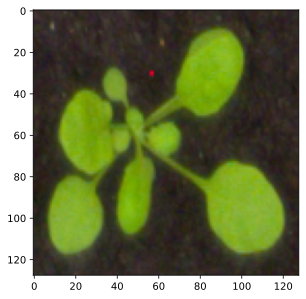

Predicted: 8 leafs
Ground Truth: 13 leafs


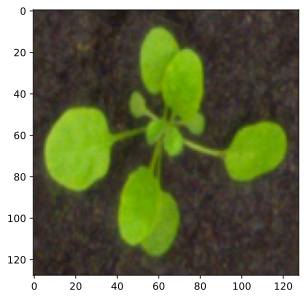

Predicted: 9 leafs
Ground Truth: 10 leafs


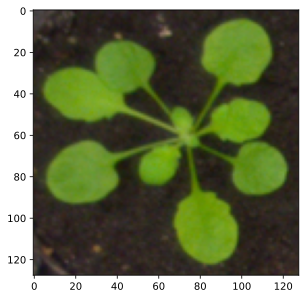

Predicted: 9 leafs
Ground Truth: 10 leafs


In [ ]:
# Load the test data for evaluation
eval_loader = load_train_data(no_aug, batch_size=1)

imgs= []
outputs = []

for index, (img, labels) in enumerate(eval_loader):
  pred_label = predict(finetune_net, img)
  # detach the tensor from the computational graph:
  label = pred_label[0].detach().cpu()
  outputs.append((label,labels))
  imgs.append(to_pil_image(img[0]))
  if index == 10:
    break

plot_samples(imgs, outputs)

## Model 3: Pre-trained ResNet50

In [ ]:
# Importing Pre-trained ResNet50
pretrained_net = torchvision.models.resnet50(pretrained=True)
pretrained_net.fc = nn.Linear(in_features=512, out_features=1, bias=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 71.3MB/s]


In [ ]:
finetune_net = torchvision.models.resnet50(pretrained=True)
finetune_net.fc = nn.Linear(finetune_net.fc.in_features, 1)
nn.init.xavier_uniform_(finetune_net.fc.weight);

### ResNet50

train_loss 0.094
test_loss 0.317
pearson -0.472
287.3 examples/sec on cuda:0


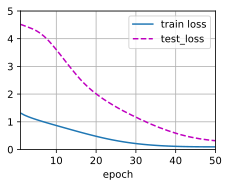

In [ ]:
train_net(finetune_net, train_augs=no_aug, test_augs=no_aug, lr=5e-5, num_epochs=50)

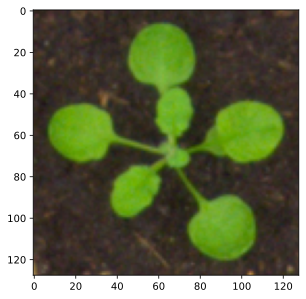

Predicted: 13 leafs
Ground Truth: 9 leafs


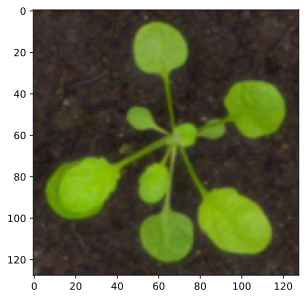

Predicted: 13 leafs
Ground Truth: 11 leafs


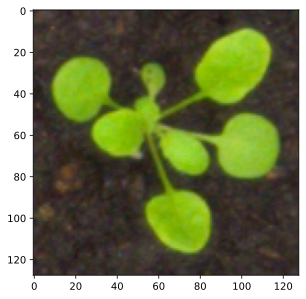

Predicted: 13 leafs
Ground Truth: 9 leafs


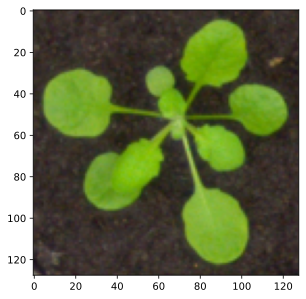

Predicted: 12 leafs
Ground Truth: 10 leafs


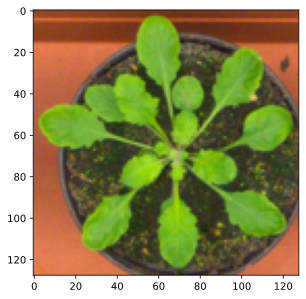

Predicted: 11 leafs
Ground Truth: 19 leafs


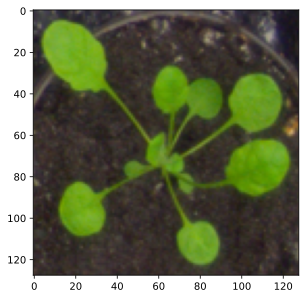

Predicted: 12 leafs
Ground Truth: 11 leafs


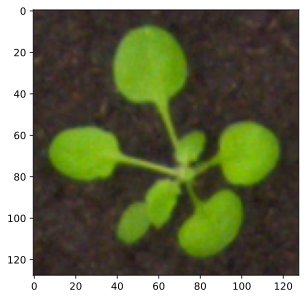

Predicted: 13 leafs
Ground Truth: 8 leafs


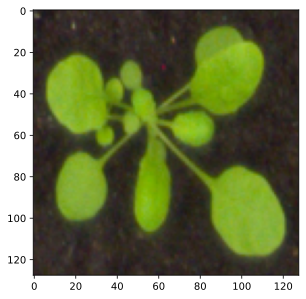

Predicted: 15 leafs
Ground Truth: 13 leafs


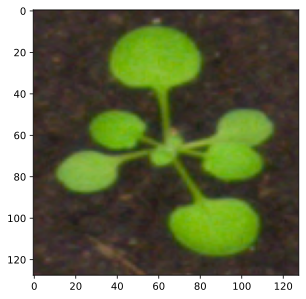

Predicted: 13 leafs
Ground Truth: 8 leafs


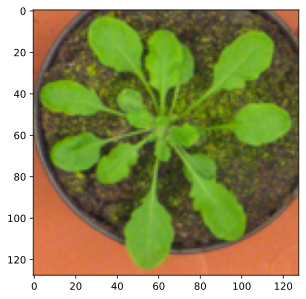

Predicted: 12 leafs
Ground Truth: 17 leafs


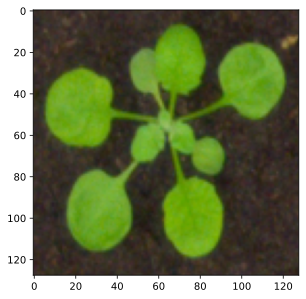

Predicted: 13 leafs
Ground Truth: 10 leafs


In [ ]:
# Load the test data for evaluation
eval_loader = load_train_data(no_aug, batch_size=1)

imgs= []
outputs = []

for index, (img, labels) in enumerate(eval_loader):
  pred_label = predict(finetune_net, img)
  # detach the tensor from the computational graph:
  label = pred_label[0].detach().cpu()
  outputs.append((label,labels))
  imgs.append(to_pil_image(img[0]))
  if index == 10:
    break

plot_samples(imgs, outputs)

### ResNet50 with Augmentation

train_loss 0.095
test_loss 0.211
pearson 0.038
285.0 examples/sec on cuda:0


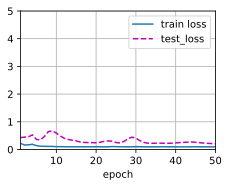

In [ ]:
train_net(finetune_net, train_augs=CustomTransform(p=1, seed=6), test_augs=no_aug, lr=5e-5, num_epochs=50)

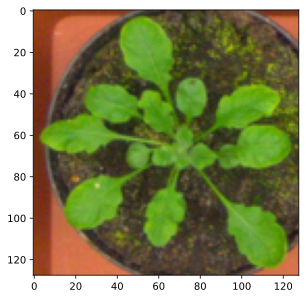

Predicted: 13 leafs
Ground Truth: 18 leafs


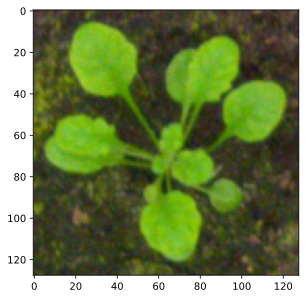

Predicted: 13 leafs
Ground Truth: 13 leafs


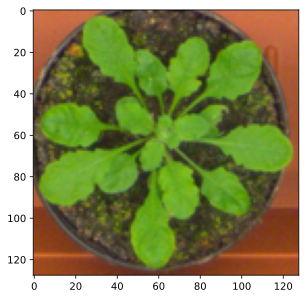

Predicted: 13 leafs
Ground Truth: 19 leafs


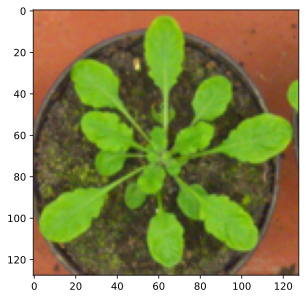

Predicted: 13 leafs
Ground Truth: 18 leafs


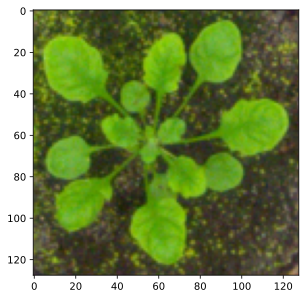

Predicted: 13 leafs
Ground Truth: 16 leafs


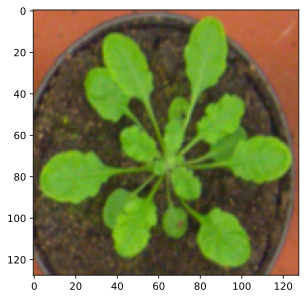

Predicted: 13 leafs
Ground Truth: 17 leafs


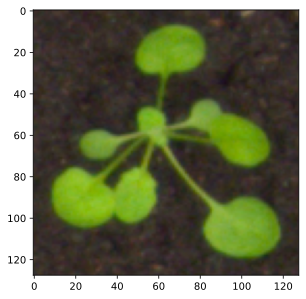

Predicted: 13 leafs
Ground Truth: 9 leafs


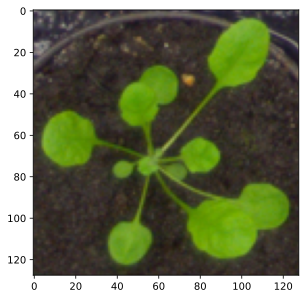

Predicted: 13 leafs
Ground Truth: 12 leafs


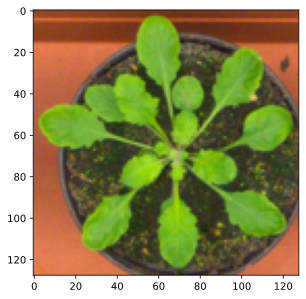

Predicted: 13 leafs
Ground Truth: 19 leafs


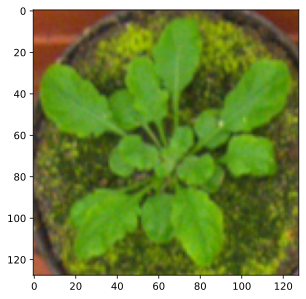

Predicted: 13 leafs
Ground Truth: 17 leafs


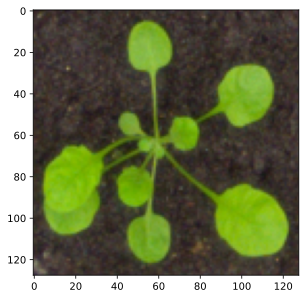

Predicted: 13 leafs
Ground Truth: 12 leafs


In [ ]:
# Load the test data for evaluation
eval_loader = load_train_data(no_aug, batch_size=1)

imgs= []
outputs = []

for index, (img, labels) in enumerate(eval_loader):
  pred_label = predict(finetune_net, img)
  # detach the tensor from the computational graph:
  label = pred_label[0].detach().cpu()
  outputs.append((label,labels))
  imgs.append(to_pil_image(img[0]))
  if index == 10:
    break

plot_samples(imgs, outputs)